## Python Integration of myeloid cells 

* Object using: NR_data_intersect.h5ad (KT made this object, contains only genes present in all datasets)
* this notebook will go from importing the object up to integration, cluster annotation will be in a seperate notebook

### Notes on the object
* I am using the intersect object and not the 'all' genes object as majority of the 'extra' genes in the all genes object are unknown, ncRNA, uncharacterised, or pseudogenes. Also by including genes only present in some datasets I worry this will cause batch specific clustering

In [1]:
#load packages I need
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm
import matplotlib.pyplot as plt
import scanpy.external as sce

In [2]:
#show current directory 
os.getcwd()
os.chdir('/scratch/user/s4436039/scdata/Python_Integration_Sep')
os.getcwd()

'/scratch/user/s4436039/scdata/Python_Integration_Sep'

Print software versions:

In [3]:
sc.logging.print_header()

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==2.2.2 scikit-learn==1.5.0 statsmodels==0.14.2 igraph==0.11.5 pynndescent==0.5.12


In [4]:
ddl.logging.print_header()

dandelion==0.3.8 pandas==2.2.2 numpy==1.26.4 matplotlib==3.9.2 networkx==3.3 scipy==1.14.0


Set plotting parameters

In [5]:
sc.settings.set_figure_params(dpi=80, facecolor="white")

In [6]:
#read in the file
data = sc.read_h5ad('/scratch/user/s4436039/scdata/Myeloid_Objects/NR_data_intersect.h5ad')

In [7]:
data

AnnData object with n_obs × n_vars = 623908 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name'

In [8]:
#remove PCA and UMAP data done previously
# Remove PCA results
if 'X_pca' in data.obsm:
    del data.obsm['X_pca']
if 'pca' in data.uns:
    del data.uns['pca']
if 'PCs' in data.varm:
    del data.varm['PCs']

# Remove UMAP results
if 'X_umap' in data.obsm:
    del data.obsm['X_umap']
if 'umap' in data.uns:
    del data.uns['umap']

In [9]:
data

AnnData object with n_obs × n_vars = 623908 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name'

In [10]:
data.obs

,nCount_RNA,nFeature_RNA,sample_type,cancer_type,patient_id,sample_id,percent.mt,site,sample_type_major,cancer_subtype,integration_id,ident,dataset_id
GSE215120_AM1_AAACCTGGTTGCTCCT-1,20298.000000,3789.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,0.975466,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated_intersect,GSE215120
GSE215120_AM1_AAAGATGTCCAAATGC-1,5574.000000,1721.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,6.045928,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated_intersect,GSE215120
GSE215120_AM1_AAAGTAGTCGGTGTTA-1,13432.000000,2759.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,2.151578,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated_intersect,GSE215120
GSE215120_AM1_AAATGCCCAGAGCCAA-1,17143.000000,2659.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,1.224990,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated_intersect,GSE215120
GSE215120_AM1_AAATGCCGTTTGGCGC-1,3603.000000,1012.000000,tumour,Acral Melanoma,AM1,GSE215120_Acral_MEL_AM1,3.608104,skin,primary tumour,Acral Melanoma,GSE215120_Acral_MEL_AM1,all_integrated_intersect,GSE215120
...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTCGATGTGACGTCC,-4.871771,-10.337130,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,1541.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated_intersect,GSE180661
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTCGATTCTGCGAGC,-4.766977,-8.292435,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,2596.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated_intersect,GSE180661
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTGATCGTTGCTCCT,-4.133310,-8.758132,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,1200.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated_intersect,GSE180661
GSE180661_HGSOC_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY_TTTGGAGGTACGACAG,-9.313746,-7.889039,Adnexa,HGSOC,Left Adnexa,SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,3165.000000,ovary,primary tumour,HGSOC,GSE180661_SPECTRUM-OV-045_S1_CD45P_LEFT_OVARY,all_integrated_intersect,GSE180661


In [11]:
data.var

,name
FAM87B,FAM87B
LINC00115,LINC00115
FAM41C,FAM41C
SAMD11,SAMD11
NOC2L,NOC2L
...,...
MT-ND4L,MT-ND4L
MT-ND4,MT-ND4
MT-ND5,MT-ND5
MT-ND6,MT-ND6


In [12]:
#tabulate number of cells per sample type/ site/ cancer type and export as csv
table1 = pd.crosstab(data.obs["dataset_id"], data.obs["cancer_subtype"])
table2 = pd.crosstab(data.obs["cancer_subtype"], data.obs["sample_type_major"])
table3 = pd.crosstab(data.obs["site"], data.obs["sample_type_major"])
table4 = pd.crosstab(data.obs["cancer_subtype"], data.obs["site"])


table1.to_csv('table_dataset-v-cancer_subtype.csv')
table2.to_csv('table_cancer_subtype-v-sample_type.csv')
table3.to_csv('table_site-v-sample_type.csv')
table4.to_csv('table_cancer_subtype-v-site.csv')

### QC Steps:

In [13]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
data.var["mt"] = data.var_names.str.startswith("MT-")

In [14]:
#calculate QC metrics
sc.pp.calculate_qc_metrics(
    data, qc_vars=["mt"], inplace=True, log1p=True
)

In [15]:
data.obs.columns.tolist()

['nCount_RNA',
 'nFeature_RNA',
 'sample_type',
 'cancer_type',
 'patient_id',
 'sample_id',
 'percent.mt',
 'site',
 'sample_type_major',
 'cancer_subtype',
 'integration_id',
 'ident',
 'dataset_id',
 'n_genes_by_counts',
 'log1p_n_genes_by_counts',
 'total_counts',
 'log1p_total_counts',
 'pct_counts_in_top_50_genes',
 'pct_counts_in_top_100_genes',
 'pct_counts_in_top_200_genes',
 'pct_counts_in_top_500_genes',
 'total_counts_mt',
 'log1p_total_counts_mt',
 'pct_counts_mt']

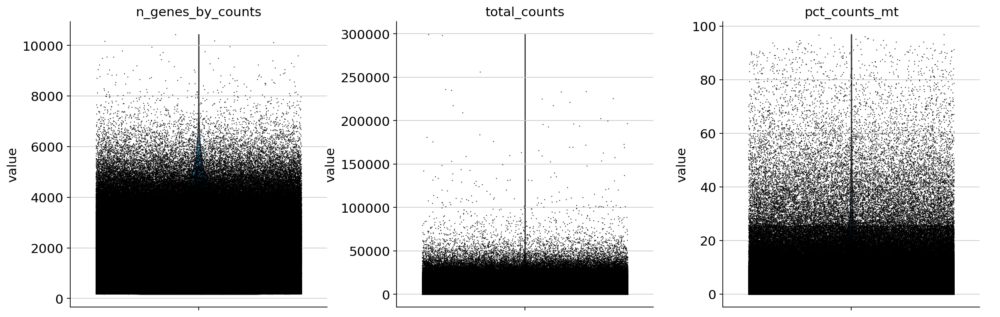

In [16]:
#plot metrics
sc.pl.violin(
    data,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

### Calculate cycling scores:
* following the method described here: https://notebook.community/theislab/scanpy_usage/180209_cell_cycle/cell_cycle

In [17]:
#load cell cycle genes previously defined in literature (Tirosh et al 2015)
cell_cycle_genes = [x.strip() for x in open('regev_lab_cell_cycle_genes.txt')]

In [18]:
# define two lists, genes associated to the S phase and genes associated to the G2M phase
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in data.var_names]

### Normalise data:

In [19]:
sc.pp.normalize_total(data, target_sum=1e4)

# Logarithmize the data:
sc.pp.log1p(data)

# check the object
data

AnnData object with n_obs × n_vars = 623908 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'log1p'

### save a version of the object here that will be used for WGCNA (after log transform but before scaling), will then need to feed the metadata (cell annotations) into this object once I have those 

In [20]:
#write out the object for WGCNA (7min)
data.write_h5ad("NRdata_for-WGCNA_no-meta.h5ad", compression="gzip")

### Identify highly variable genes:

In [21]:
# (Expects logarithimised data)
sc.pp.highly_variable_genes(data, min_mean=0.0125, max_mean=3, min_disp=0.5)
data

AnnData object with n_obs × n_vars = 623908 × 15074
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [22]:
#set hidden slot
data.raw = data

In [23]:
# to see genes
data.var  # there is now a hvg column

,name,mt,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm
FAM87B,FAM87B,False,1593,0.002608,0.002604,99.744674,1627.0,7.395108,False,0.003131,1.017997,-1.808694
LINC00115,LINC00115,False,13748,0.023226,0.022961,97.796470,14491.0,9.581352,False,0.033554,1.597652,-0.425234
FAM41C,FAM41C,False,10546,0.017495,0.017343,98.309687,10915.0,9.297985,False,0.022248,1.542000,-0.558058
SAMD11,SAMD11,False,949,0.001802,0.001800,99.847894,1124.0,7.025538,False,0.002381,1.669414,-0.253960
NOC2L,NOC2L,False,103531,0.211007,0.191452,83.406047,131649.0,11.787902,False,0.233704,1.515548,-0.621190
...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND4L,MT-ND4L,True,459268,6.269149,1.983639,26.388506,3911372.0,15.179399,True,2.498015,4.540784,1.878395
MT-ND4,MT-ND4,True,588421,47.422801,3.879971,5.687858,29587465.0,17.202861,False,4.173388,4.378180,0.304262
MT-ND5,MT-ND5,True,544183,12.252872,2.584214,12.778326,7644665.0,15.849519,True,2.894607,3.346545,0.625154
MT-ND6,MT-ND6,True,268365,1.325729,0.844034,56.986447,827133.0,13.625722,True,1.132630,3.572825,4.222325


In [24]:
#to get number of HV genes (because the column "highly_variable" is a boolean vector - ie it gives True (1) or False (0), you can use sum function to know)
print(data.var.highly_variable.sum())

1634


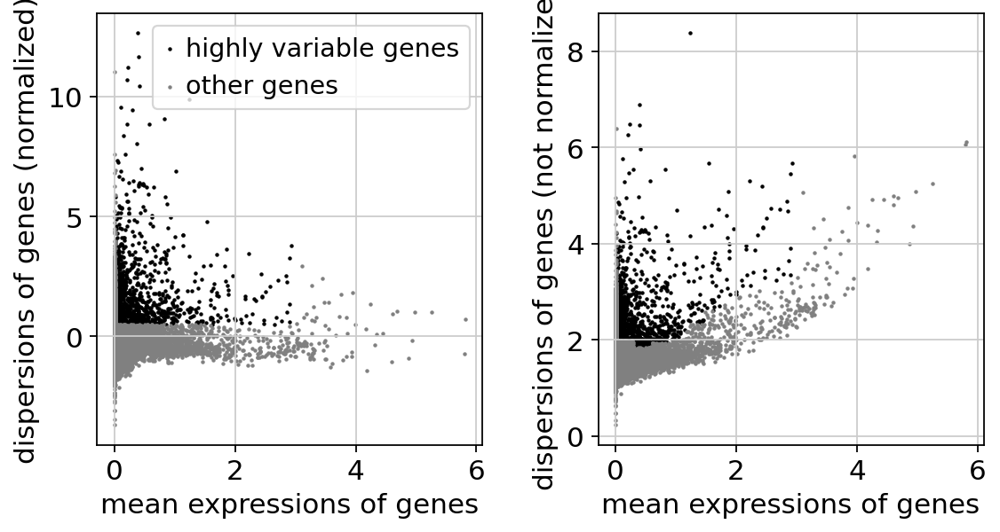

In [25]:
#plot out the number of highly variable genes
sc.pl.highly_variable_genes(data)

### Perform dimensionality reduction and scaling:

In [26]:
# Actually do the filtering for PCA
data = data[
    :, data.var.highly_variable
].copy()  # all rows/indexes : columns only selecting for those within high_variable, and then making a copy of itself
data

AnnData object with n_obs × n_vars = 623908 × 1634
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'

In [27]:
#regress out effects of total_counts per cell and % of mt genes (~9min)
sc.pp.regress_out(data, ["total_counts", "pct_counts_mt"])

In [28]:
# Scale each gene to unit variance. Clip values exceeding std of 10.
sc.pp.scale(data, max_value=10)

### After scaling now regress out cycling genes and re-scale

In [29]:
#cell cycle scoring, this adds three slots in data, a score for S phase, a score for G2M phase and the predicted cell cycle phase.
sc.tl.score_genes_cell_cycle(data, s_genes=s_genes, g2m_genes=g2m_genes)

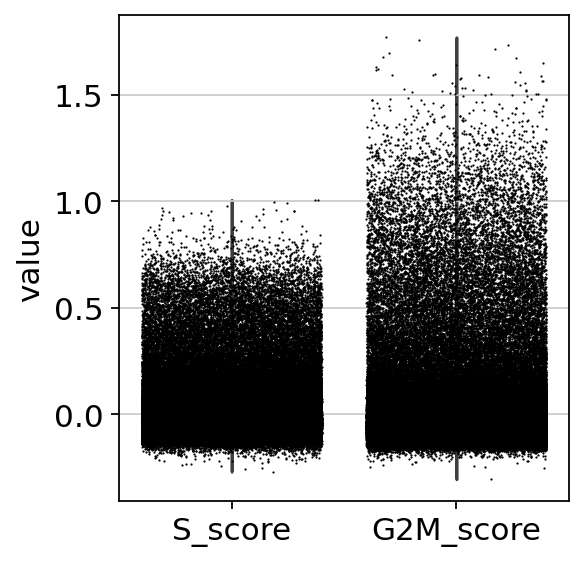

In [30]:
sc.pl.violin(data, ['S_score', 'G2M_score'],
             jitter=0.4)

In [31]:
#Regress out cycling genes (9min)
sc.pp.regress_out(data, ['S_score', 'G2M_score'])
sc.pp.scale(data)

In [32]:
data

AnnData object with n_obs × n_vars = 623908 × 1634
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase'
    var: 'name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg'

In [50]:
#gene_of_interest = 'MCM5'  

# Check if the gene is in the .var index
#if gene_of_interest in data.var_names:
#    print(f"{gene_of_interest} is present in the dataset.")
#else:
#    print(f"{gene_of_interest} is not present in the dataset.")

MCM5 is not present in the dataset.


### Perform PCA: 

* note originally I tried increases the number of PCs a lot (>100) but this made the integration later on converge really fast and then not be well integrated, likely because increasing PCs too much can increase noise or lead to overfitting of batch effects, therefore decreased to 60

In [33]:
## perform PCA, adjust number of PCs to calculate from default (50) to 60. (3mins)
sc.tl.pca(data, n_comps=60)

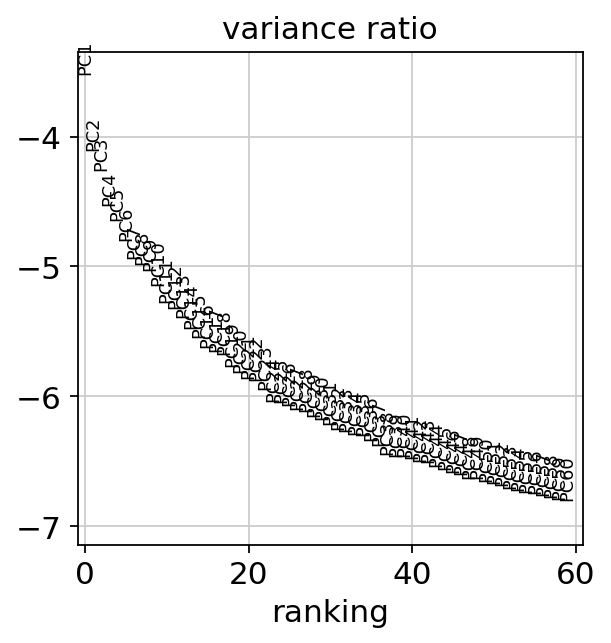

In [35]:
# make elbow plot to see variance contribution by each pc, choose inflection point
sc.pl.pca_variance_ratio(data, log=True, n_pcs=60)

#based on graph choose to use 60 PCs going forward

### Export out the object that will be used for integration:

In [36]:
#at this point export out the object as the one we will use for integration (11min)
data.write_h5ad("NRdata_pre-int.h5ad", compression="gzip")

In [6]:
#read in the file
#data = sc.read_h5ad('NRdata_pre-int.h5ad')

### Perform neigborhood and UMAP on unintegrated data as a comparison:

### Neighborhood graph:

In [37]:
## Computing neighbourhood graph - here UMAP (3min)
sc.pp.neighbors(data, n_neighbors=10, n_pcs=60)

### UMAP (~16min):

In [38]:
#Embedding the neighbourhood graph using UMAP 
sc.tl.umap(data, min_dist=0.3)  # 0.3 is personal preference

### UMAP Visualisation:

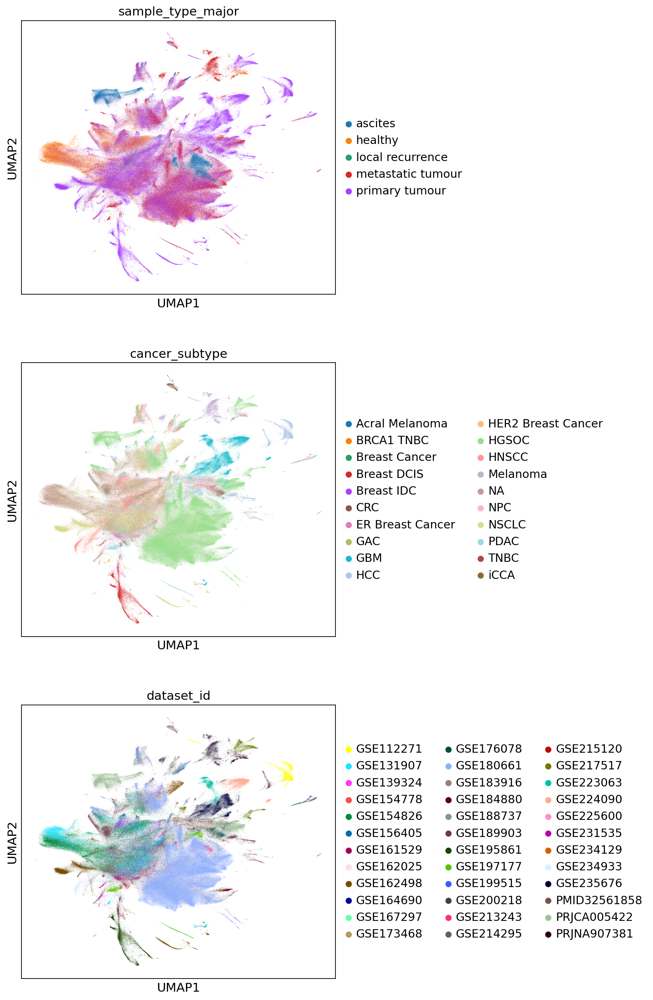

In [39]:
#visualise UMAP
with plt.rc_context({"figure.figsize": (6, 6)}):
    sc.pl.umap(
        data,
        color=[
            "sample_type_major",
            "cancer_subtype",
            "dataset_id",
        ],
        ncols=1,
    )

In [40]:
#write out the unintegrated object to be read in later if needed (12min)
data.write_h5ad("NRdata_unintegrated.h5ad", compression="gzip")

## Integration: 
#### want to perform integration after running PCA but before computing neighbor graph (perform on NRdata_pre-int.h5ad)

### Integration step was done by submitting a job. 

* Bashscript is named: 2024-09-10_bashscript-NR-int.sh
* python script named: 2024-09-10_NR-Integration-script.py

Ran with `sbatch 2024-09-10_bashscript-NR-int.sh`

Bashscript: 
``` bash
#!/bin/bash
#SBATCH --nodes=1
#SBATCH --ntasks-per-node=1
#SBATCH --cpus-per-task=64
#SBATCH --mem=400G
#SBATCH --job-name=NR-Integration
#SBATCH --time=18:00:00
#SBATCH --partition=general
#SBATCH --account=a_kelvin_tuong
#SBATCH -o NR-Integration.output
#SBATCH -e NR-Integration.error

# export JAVA_CMD=/home/uqztuong/miniforge3/bin/java
source ~/.bashrc
mamba activate env
python3 2024-09-10_NR-Integration-script.py
```

Python script: 
``` python
import os
import tools
import scanpy as sc
import pandas as pd
import dandelion as ddl
from tqdm import tqdm
import matplotlib.pyplot as plt
import scanpy.external as sce

os.chdir('/scratch/user/s4436039/scdata/Python_Integration_Sep')

data_pre = sc.read_h5ad('/scratch/user/s4436039/scdata/Python_Integration_Sep/NRdata_pre-int.h5ad')

sce.pp.harmony_integrate(data_pre, 'integration_id', max_iter_harmony=200, verbose=True)

data_pre.write_h5ad("/scratch/user/s4436039/scdata/Python_Integration_Sep/NRdata_post-int.h5ad", compression="gzip")
```

Started run at ~3:30pm, finished 

### Read in data after integration:

In [6]:
#read in after integration
data = sc.read_h5ad('data_i_integrated2.h5ad')

In [7]:
data.obsm

AxisArrays with keys: X_pca, X_pca_harmony

In [8]:
#check it made new column with adjusted harmony PCs
'X_pca_harmony' in data.obsm

True

In [9]:
#assign the new PCs to the standard PCA slot
data.obsm['X_pca'] = data.obsm['X_pca_harmony']

### Neighborhood graph:

In [10]:
## Computing neighbourhood graph - here UMAP
sc.pp.neighbors(data, n_neighbors=10, n_pcs=125)

### UMAP (~15min):

In [11]:
sc.tl.umap(data, min_dist=0.3)  # 0.3 is personal preference

### UMAP Visualisation:

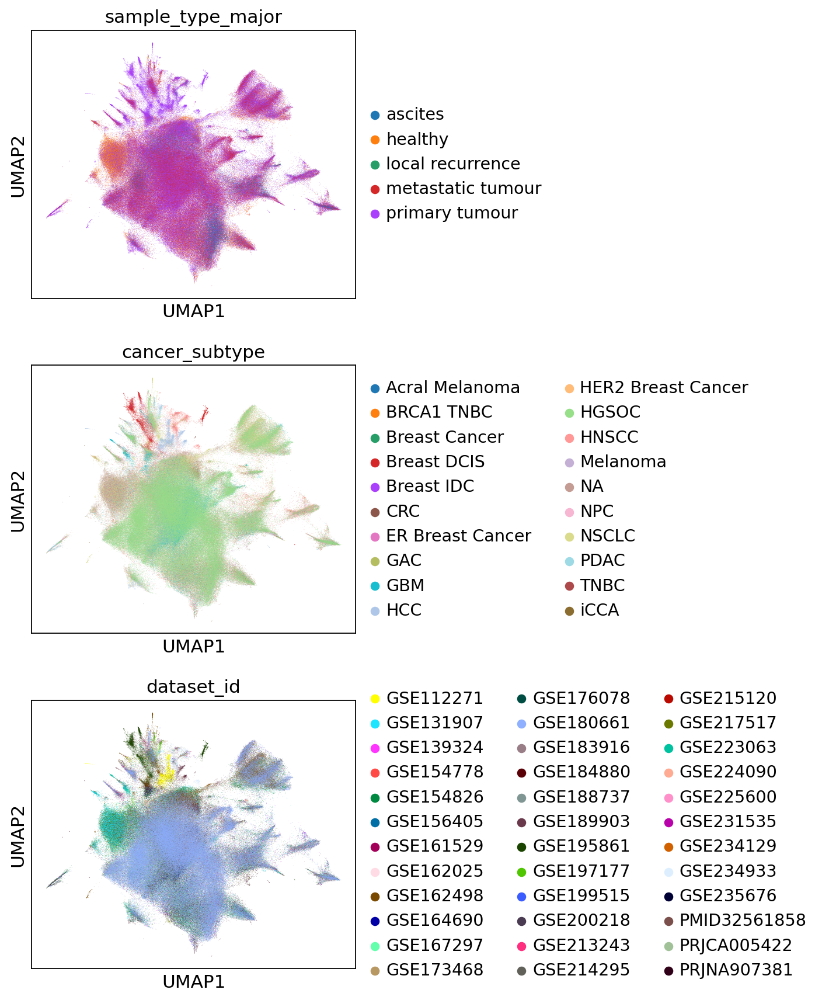

In [12]:
#same as above 
#visualise UMAP --> can see now integrated
sc.pl.umap(
    data,
    color=[
        "sample_type_major",
        "cancer_subtype",
        "dataset_id",
    ],
    ncols=1,
)

### did not integrate properly??

In [16]:
#split plot by sample_type_major, cancer_subtype etc

#define function
def cluster_small_multiples(
    data_int, clust_key, size=30, frameon=False, legend_loc=None, **kwargs
):
    tmp = data_int.copy()

    for i, clust in enumerate(data_int.obs[clust_key].cat.categories):
        tmp.obs[clust] = data_int.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", data_int.uns[clust_key + "_colors"][i]]

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color=data_int.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs
    )

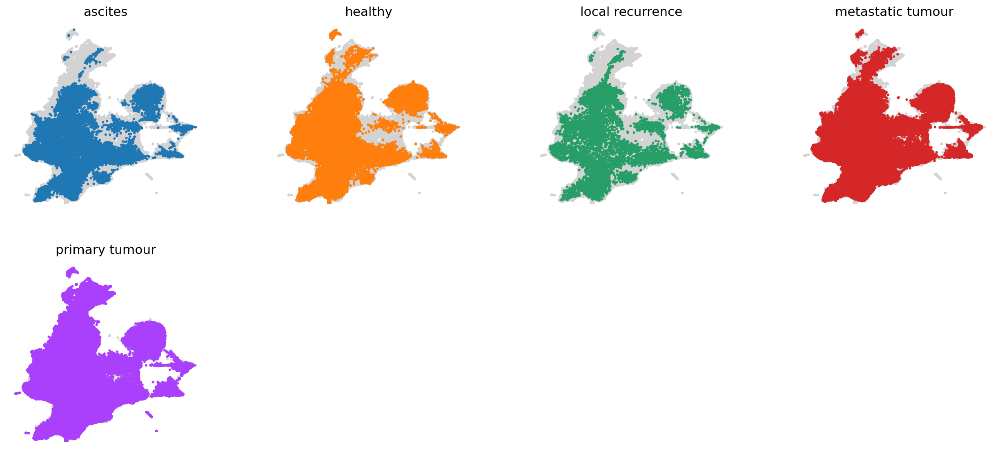

In [17]:
cluster_small_multiples(data_int, "sample_type_major")

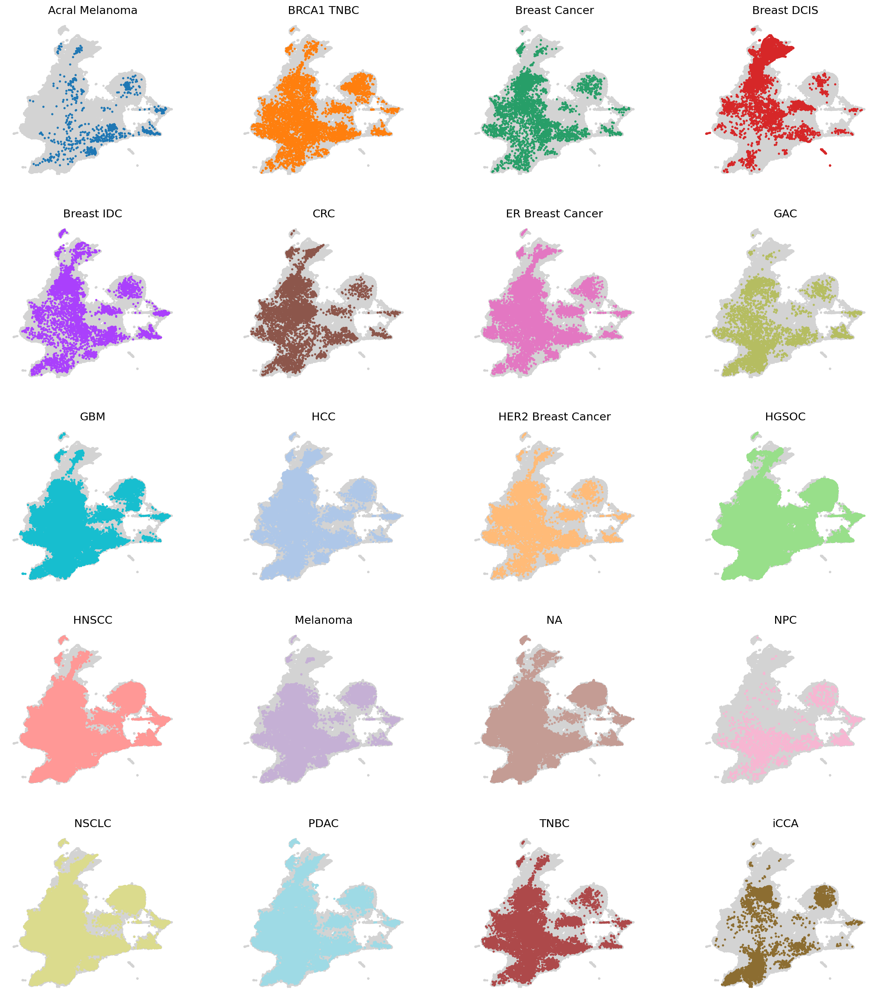

In [18]:
cluster_small_multiples(data_int, "cancer_subtype")

In [21]:
data_int

AnnData object with n_obs × n_vars = 623908 × 1634
    obs: 'nCount_RNA', 'nFeature_RNA', 'sample_type', 'cancer_type', 'patient_id', 'sample_id', 'percent.mt', 'site', 'sample_type_major', 'cancer_subtype', 'integration_id', 'ident', 'dataset_id'
    var: 'name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'sample_type_major_colors', 'cancer_subtype_colors', 'dataset_id_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [22]:
data_int.write_h5ad("data_i_int2.h5ad", compression="gzip")

In [6]:
data_int = sc.read_h5ad('data_i_int2.h5ad')

### This completed integration, next step in analysis is annotating the clusters. See jpynb: _________

### Clustering (20min):

In [8]:
sc.tl.leiden(data_int, resolution=0.2)

/scratch/temp/10354591/ipykernel_680163/965630358.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


In [ ]:
data_int.write_h5ad("data_i_int3.h5ad", compression="gzip")

In [6]:
data_int = sc.read_h5ad('data_i_int3.h5ad')

### Visualising clusters:

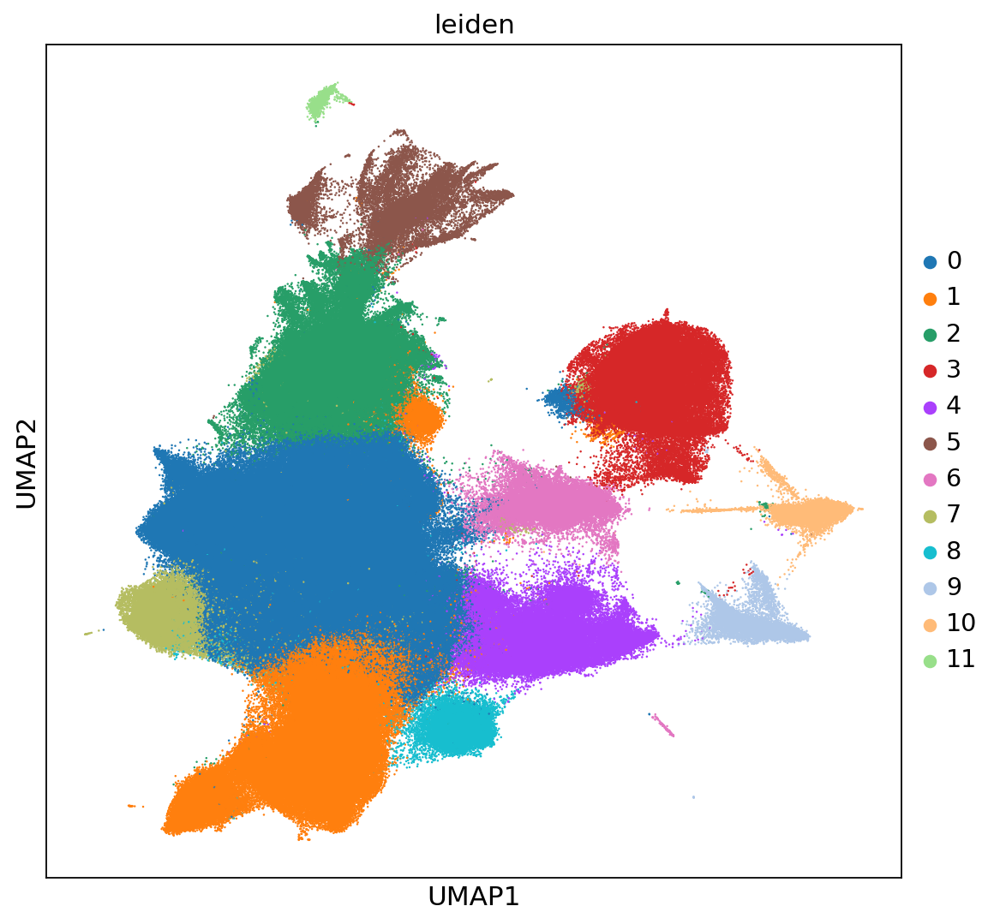

In [17]:
#plotting clusters
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data_int, color="leiden", size=5)

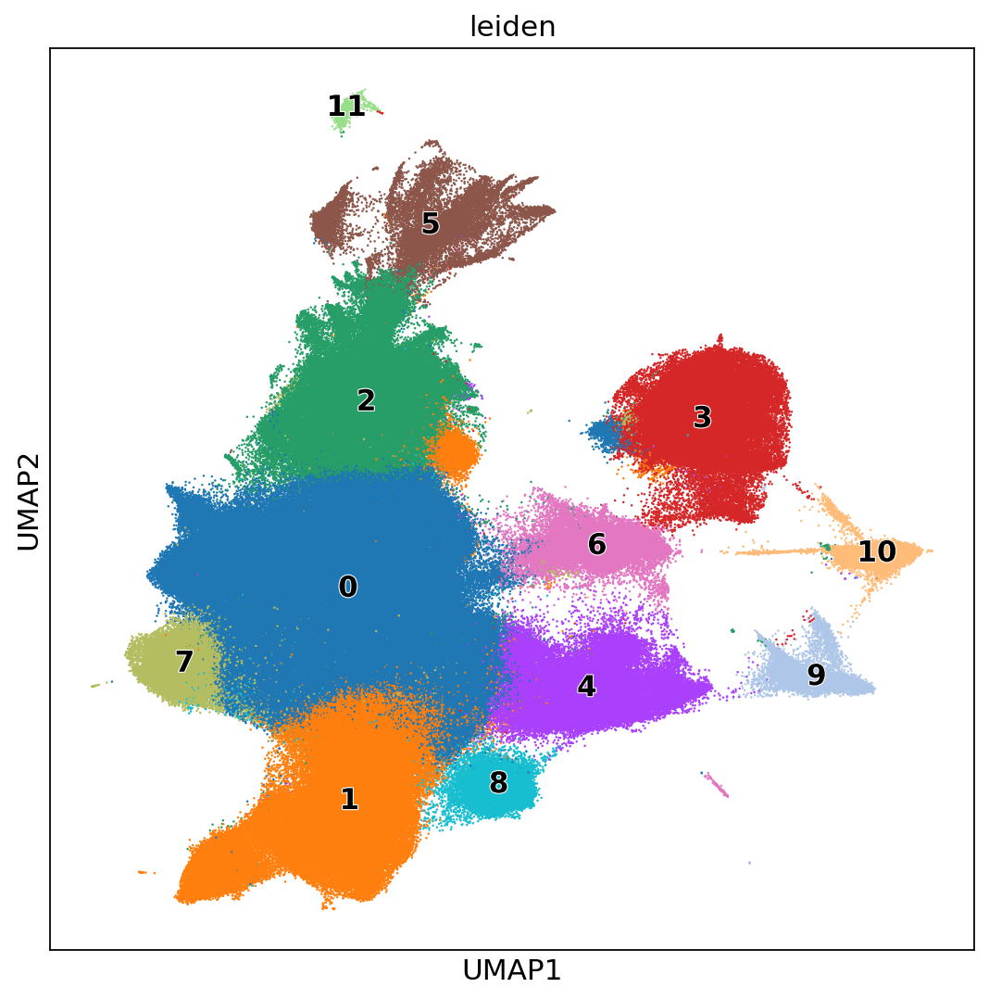

In [16]:
#plotting clusters
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data_int, color="leiden", legend_loc="on data", legend_fontoutline=1, size=5)

In [38]:
#how many cells are there per cluster
data_int.obs.groupby(["leiden"]).apply(len)

/scratch/temp/10354639/ipykernel_1315532/3008939564.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/scratch/temp/10354639/ipykernel_1315532/3008939564.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.


leiden
0     243198
1     110471
2      94572
3      49173
4      40338
5      19496
6      17703
7      15724
8      15189
9       8367
10      7303
11      2374
dtype: int64

In [40]:
pd.crosstab(data_int.obs["sample_type_major"], data_int.obs["leiden"])

leiden,0,1,2,3,4,5,6,7,8,9,10,11
sample_type_major,,,,,,,,,,,,
ascites,11680,11606,6595,1175,5145,90,372,942,335,277,1069,6
healthy,30478,17955,11291,5873,3550,575,173,1066,1001,624,742,455
local recurrence,2044,1783,1198,533,677,112,281,247,211,463,139,6
metastatic tumour,67844,25567,16378,11474,9417,4055,6280,5812,3375,1457,1519,73
primary tumour,131152,53560,59110,30118,21549,14664,10597,7657,10267,5546,3834,1834


In [41]:
pd.crosstab(data_int.obs["sample_type_major"], data_int.obs["leiden"]).apply(
    lambda r: r / r.sum() * 100, axis=1
)

leiden,0,1,2,3,4,5,6,7,8,9,10,11
sample_type_major,,,,,,,,,,,,
ascites,29.726153,29.537819,16.784587,2.990431,13.094269,0.229054,0.946758,2.397435,0.852591,0.704978,2.720656,0.015270
healthy,41.307618,24.334874,15.302983,7.959828,4.811406,0.779312,0.234471,1.444777,1.356681,0.845723,1.005652,0.616673
local recurrence,26.566155,23.173902,15.570574,6.927476,8.799064,1.455680,3.652197,3.210294,2.742397,6.017676,1.806603,0.077983
metastatic tumour,44.269858,16.683089,10.687043,7.487064,6.144821,2.645986,4.097853,3.792471,2.202269,0.950728,0.991184,0.047634
primary tumour,37.483995,15.307756,16.893978,8.607897,6.158828,4.191055,3.028683,2.188415,2.934368,1.585079,1.095779,0.524168


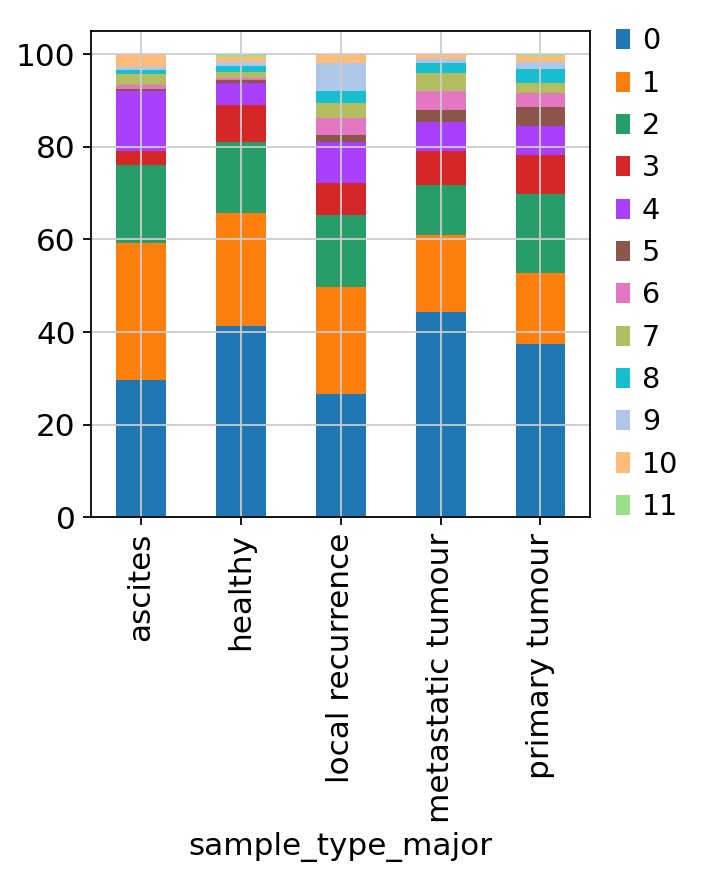

In [42]:
#### Creating a stacked bar
pd.crosstab(data_int.obs["sample_type_major"], data_int.obs["leiden"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

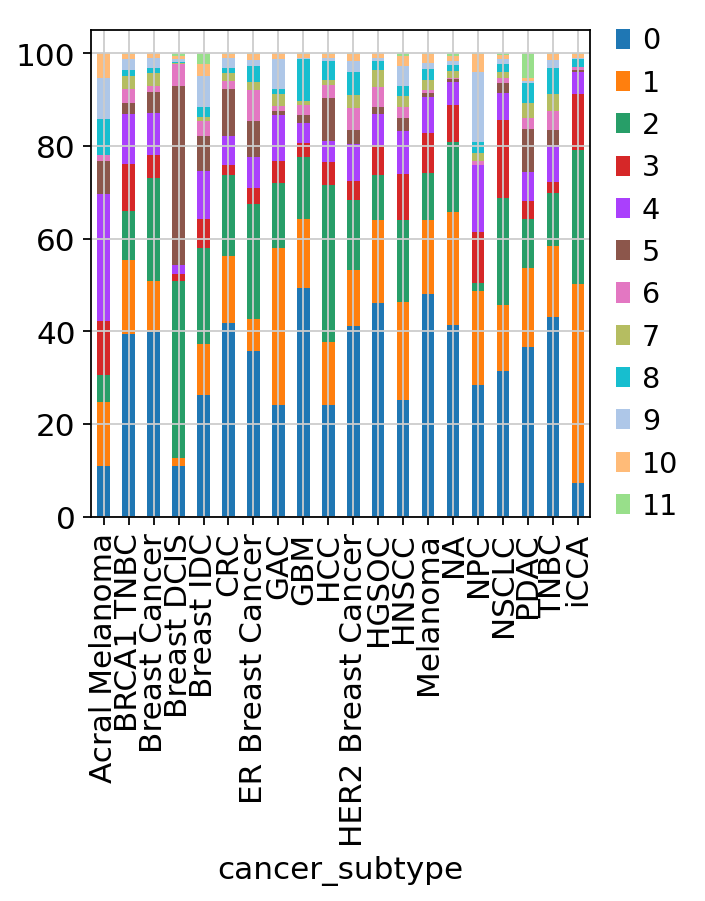

In [43]:
#### Creating a stacked bar
pd.crosstab(data_int.obs["cancer_subtype"], data_int.obs["leiden"]).apply(
    lambda r: r / r.sum() * 100, axis=1
).plot.bar(stacked=True)
plt.legend(bbox_to_anchor=(1, 0.5), loc="center left", frameon=False)

### Annotate clusters

KeyError: 'Could not find key HLA-DRA in .var_names or .obs.columns.'

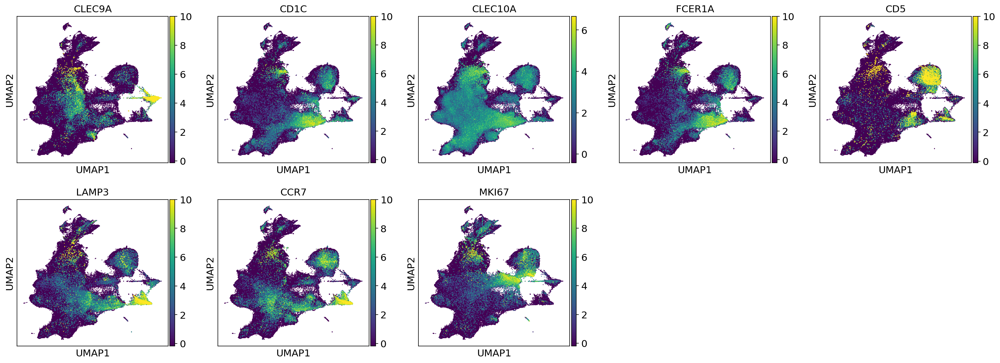

In [11]:
#plot DC/mac marker genes on UMAP 
sc.pl.umap(
    data_int,
    color=[
        "CLEC9A",
        "XCR1",
        "CD1C",
        "CLEC10A",
        "FCER1A",
        "CD5",
        "CD163",
        "CD14",
        "CD274",
        "LAMP3",
        "CCR7",
        "MKI67",
        "HLA-DRA",
        "FCGR1A",
        "CD68",
        "CD33",
        "CSF1R",
        "CD19",
        "CD56",
        "IL3RA",
        "CLEC4C"
    ],
    ncols=5,
    size=5,
)



In [ ]:
#plot DC/mac marker genes on dot plot - scanpy tute (mathod to make dot point with group labels for cell types)

In [44]:
#find DEG genes for each cluster: scanpy tute
# Obtain cluster-specific differentially expressed genes
sc.tl.rank_genes_groups(data_int, groupby="leiden", method="wilcoxon")

/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
/home/s4436039/miniforge3/envs/env/lib/python3.12/site-packages/scanpy/tools

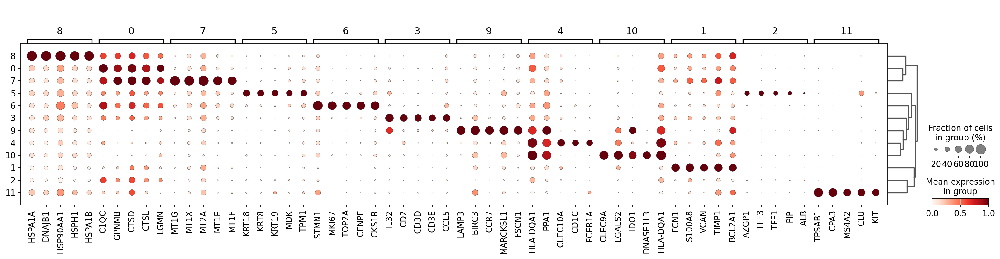

In [45]:
#visualise the top 5 DEG genes for each cluster
sc.pl.rank_genes_groups_dotplot(
    data_int, groupby="leiden", standard_scale="var", n_genes=5
)

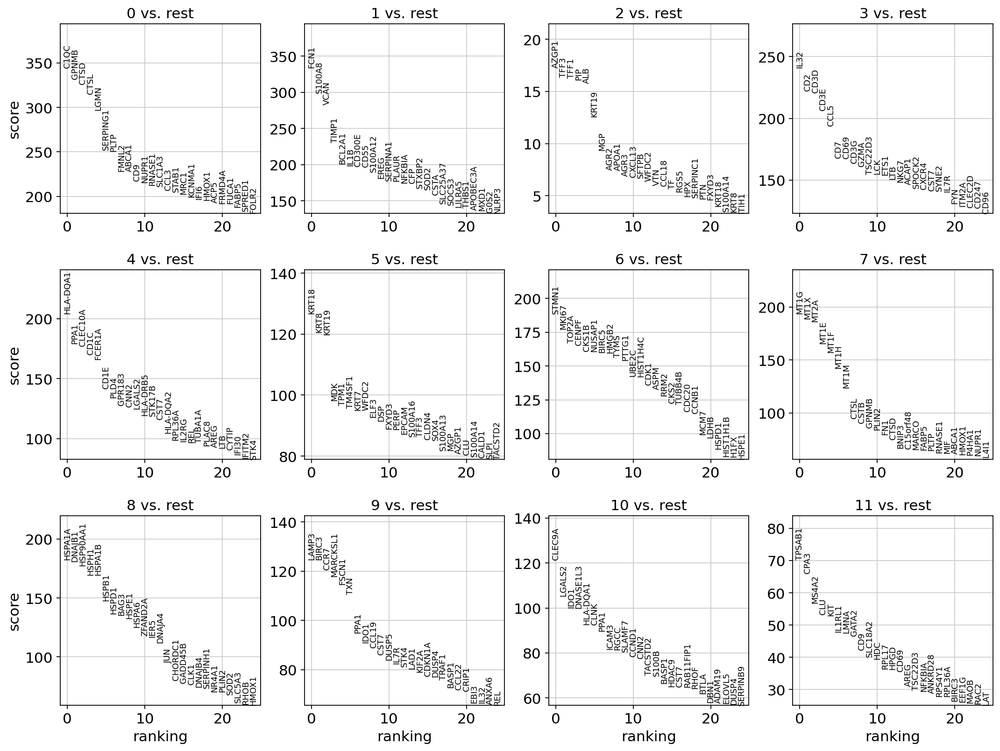

In [52]:
sc.pl.rank_genes_groups(data_int, n_genes=25, sharey=False)  # sharey means each panel

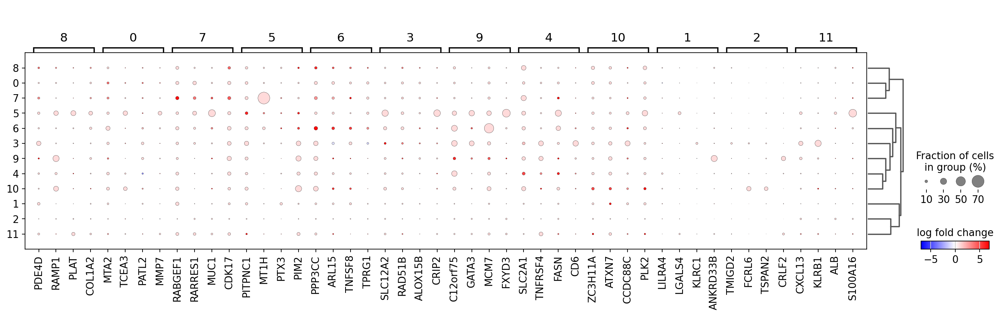

In [50]:
sc.pl.rank_genes_groups_dotplot(
    data_int,
    n_genes=4,
    values_to_plot="logfoldchanges",
    min_logfoldchange=3,
    vmax=7,
    vmin=-7,
    cmap="bwr",
)

In [ ]:
#export DEG genes for each cluster 

In [ ]:
#annotate clusters

In [ ]:
#plot cluster proportion by sample_type_major (ie. trying to see what clusters aren't present in healthy) - done above

### Overlay signature:

#### I think the scanpy equivalent of AddModuleScore in Seurat is sc.tl.score_genes, trying this

In [46]:
#define list of gene names used for score calculation

#make an object with my sigs - see excel file Nikita-mregDC_DEG_summary on i drive

Up_sig = ["CCL22","IL4I1","SIRPA","CCR7","CHST11","GPR157","RGS1","BIRC3","TRAF1","CSF2RA","TBC1D13","LAMP3","MREG","PPP1R14A","SPRED2","CD83","TXN","MOB3A","NFKB1","TBC1D4","CDK2","WFDC21P","ARAP2","ZER1","ACSL1","SPINT2","SQSTM1","TBC1D8","JAG1","AC073508.3","BATF","ETV3","BCL2","KIF2A","FSCN1","TNFAIP3","CCDC28B","NR4A3","CYTIP","PLEK","FOXO1","TOMM34","TRAFD1","PPP1R16B","CXCR4","CD40","ENTPD7","CDKN1A","BID","MARCKS","DUSP5","MAP4K4","BCL2L1","ISG20","RNF145","RNF121","GPR132","RASGEF1B","CYRIA","RAB10","CERS6","IL1R1","STK4","CLEC2D","AL390719.1","ZBTB38","IFNGR2","CD274","SLC41A2","NRP2","ANKRD33B","GPR183","POGLUT1","ADORA2A","JADE3","KHDRBS3","CTNNB1","SLCO5A1","NFKB2","RGS2","SEC61B","ZNRF1","RELB","C12orf45","IRF2","EPOP","MXD1","RAB5B","PADI2","DRAM1","MTMR4","EEF2K","GCNT2","RAPH1","BCL2A1","SEC23B","PIM3","ANTXR2","ABTB2","TMEM200A"]    

In [47]:
#score genes
sc.tl.score_genes(data_int, Up_sig)

       'CD83', 'MOB3A', 'TBC1D4', 'CDK2', 'WFDC21P', 'ARAP2', 'ZER1', 'SPINT2',
       'SQSTM1', 'TBC1D8', 'JAG1', 'AC073508.3', 'ETV3', 'BCL2', 'CCDC28B',
       'TOMM34', 'TRAFD1', 'CD40', 'ENTPD7', 'BID', 'MARCKS', 'BCL2L1',
       'RNF145', 'RNF121', 'RASGEF1B', 'CYRIA', 'RAB10', 'CERS6', 'AL390719.1',
       'ZBTB38', 'IFNGR2', 'CD274', 'SLC41A2', 'NRP2', 'POGLUT1', 'JADE3',
       'KHDRBS3', 'SLCO5A1', 'NFKB2', 'SEC61B', 'ZNRF1', 'RELB', 'C12orf45',
       'IRF2', 'EPOP', 'RAB5B', 'PADI2', 'DRAM1', 'MTMR4', 'EEF2K', 'GCNT2',
       'RAPH1', 'SEC23B', 'PIM3', 'ANTXR2', 'TMEM200A'],
      dtype='object')


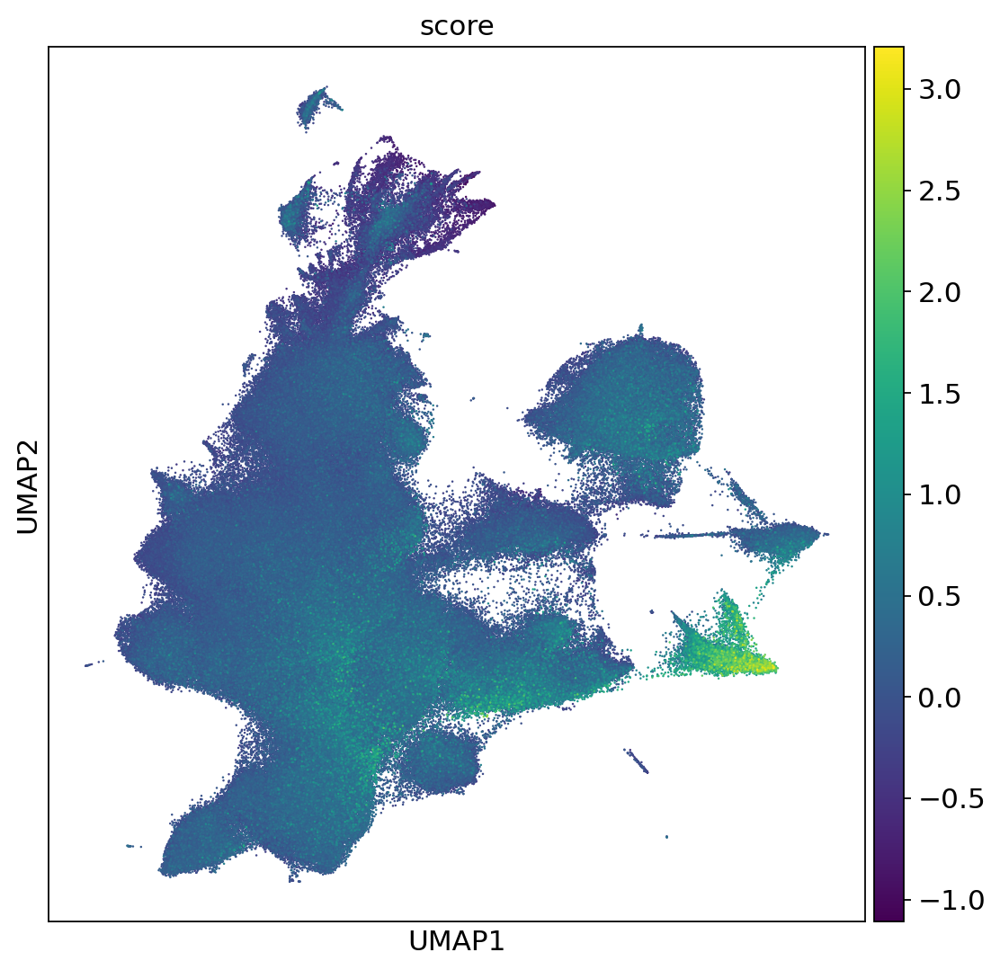

In [9]:
#plotting clusters
with plt.rc_context({"figure.figsize": (8, 8)}):
    sc.pl.umap(data_int, color="score", size=5)

In [53]:
data_int.write_h5ad("data_i_int4.h5ad", compression="gzip")

In [8]:
data_int = sc.read_h5ad('data_i_int4.h5ad')

In [ ]:
#mregDC --> cluster 9, split plot by cancer type